## Purpose:

In this notebook, we take our newly cleaned data and start exploring it. I hope to generate basic histograms and plots to summarize what we have.


In [2]:
#imports 
#Imports:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import pandas as pd
import numpy as np
import altair as alt
import matplotlib.pyplot as plt
import re
# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("."))

['.git', 'req.txt', 'tests', 'src', 'readme.MD', 'notebooks', '__pycache__', 'Basic Stats & Visualizations.ipynb', 'Makefile', 'simplefront.py', 'web', 'Cleaning and Subsetting the ILS Dataset.ipynb', '.ipynb_checkpoints', 'Data Tidying.ipynb', 'data']


In [3]:
#settings:
#Settings:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
alt.renderers.enable('notebook')
alt.data_transformers.enable('default', max_rows=None)
%matplotlib inline 
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 40)
pd.set_option('display.width', 1000)

In [4]:
dfILS = pd.read_csv("./data/results/ILS_clean.csv")


In [6]:
dfILS.head(5)
dfILS.shape
dfILS.describe()

,invoicenumber,date,city,zipcode,storenumber,countynumber,categorynumber,vendornumber,itemnumber,bottlevolumeml,statebottlecost,statebottleretail,bottlessold,saleprice,volumesoldlitre
0,S28865700001,11/09/2015,WATERLOO,50702,2538,7,1701100,962,238,1500,11.62,17.43,6,104.58,9
1,S29339300091,11/30/2015,MUSCATINE,52761,2662,70,1701100,65,173,750,19.58,29.37,4,117.48,3
2,S28866900001,11/11/2015,HOLSTEIN,51025,3650,47,1701100,962,238,1500,11.62,17.43,1,17.43,1
3,S29134300126,11/18/2015,ONAWA,51040,3723,67,1081200,305,258,6000,99.00,148.50,1,148.50,6
4,S29282800048,11/23/2015,PELLA,50219,2642,63,1701100,962,238,1500,11.62,17.43,6,104.58,9


(12488910, 15)

,zipcode,storenumber,countynumber,categorynumber,vendornumber,itemnumber,bottlevolumeml,statebottlecost,statebottleretail,bottlessold,saleprice,volumesoldlitre
count,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07
mean,5.126783e+04,3.560455e+03,5.724649e+01,1.044710e+06,2.574913e+02,4.594006e+04,9.293158e+02,9.648421e+00,1.449537e+01,8.136619e+00,1.165923e+02,7.181478e+00
std,9.892279e+02,9.286745e+02,2.727570e+01,5.437328e+04,1.416116e+02,5.223116e+04,7.356798e+02,1.139734e+01,1.709558e+01,2.221481e+01,3.851037e+02,2.689221e+01
min,5.000200e+04,2.106000e+03,1.000000e+00,1.011100e+06,1.000000e+01,1.010000e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,5.031600e+04,2.603000e+03,3.100000e+01,1.012210e+06,1.150000e+02,2.705600e+04,7.500000e+02,5.500000e+00,8.250000e+00,2.000000e+00,2.541000e+01,1.000000e+00
50%,5.110100e+04,3.700000e+03,6.200000e+01,1.031200e+06,2.600000e+02,3.817600e+04,7.500000e+02,7.960000e+00,1.195000e+01,4.000000e+00,6.714000e+01,3.000000e+00
75%,5.231000e+04,4.301000e+03,7.700000e+01,1.062310e+06,3.800000e+02,6.354500e+04,1.000000e+03,1.175000e+01,1.763000e+01,1.200000e+01,1.327200e+02,9.000000e+00
max,5.620100e+04,9.931000e+03,9.900000e+01,1.901200e+06,9.870000e+02,9.992750e+05,3.780000e+05,7.680000e+03,1.152000e+04,1.500000e+04,2.541000e+05,1.500000e+04


So we have over 12M entries. I'd like a box plot as the describe() method is hard to see. One thing we can do is distill all the unique points per catagory, and see the ranges.

For an Altair Box Plot, we choose a row catagory (X), and pick an attribute to focus on (Y). For every row of that catagory, the attribute will be picked out and used as a sample point for our boxplot. Our data has to be in a melted form, it seems.

In [43]:
#Lets make a box plot for all of our name-number catagories.
#"categorynumber""itemnumber"
types = ["storenumber","vendornumber","countynumber"]
N = 10000
numArr = np.zeros((30000,))
typeList = []

for i,item in enumerate(types):
    typeList.append([item] * N)
    numArr[i*N:(i+1)*N] = dfILS[item].sample(n=N).values

flatList = [val for sublist in typeList for val in sublist]
    

In [86]:
#lets make a funciton that generates our dataframe for a particular column.
#pull 9998 points and add the max and the min
#get all unique values and generate for the plot, return a tuple of DFs
def gensampledf(colName,N):
    numArr = np.zeros((N,))
    typeList = []
    
    if (N <= 2):
        return "N >=3! Input N too small."
    
    #first get our 10000 points. including max&min.
    numArr[0] = dfILS[colName].max()
    numArr[1] = dfILS[colName].min()
    numArr[2:N] = dfILS[colName].sample(n=(N-2)).values
    typeList.append([colName+"_samples"] * N)
    flatList = [val for sublist in typeList for val in sublist]
                                     
    dfSample = pd.DataFrame({'catname':flatList, "points":numArr})
                                     
    #now get unique values.
    uniques = dfILS[colName].unique()
    typeList = []
    typeList.append([colName+"_uniques"] * uniques.shape[0])
    flatList = [val for sublist in typeList for val in sublist]
                                     
    dfUnique = pd.DataFrame({'catname':flatList, "points":uniques})
    return pd.concat([dfSample,dfUnique])
    
#hold = gensampledf('itemnumber',10000)
#hold.shape

def prodchart(source):
    chart = alt.Chart(source).mark_boxplot(extent=2.5,size=35).encode(
        y='catname:O',
        x='points:Q',
        color="catname").properties(
        height=100, width=300)
    
    return chart

#mychart = prodchart(hold)
                                     

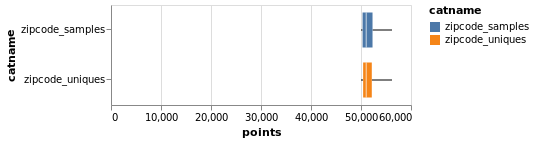

In [87]:
prodchart(gensampledf("zipcode",10000))
#mychart | mychart & mychart | mychart #this shows that and is before OR!

I wanted to see my sample method vs the unique method. It seems the sample number (10000) is too low in many cases. 
I will stick with uniques for the final plot, and for my tableau export data frame. Proper scaling of each axis must also be done!

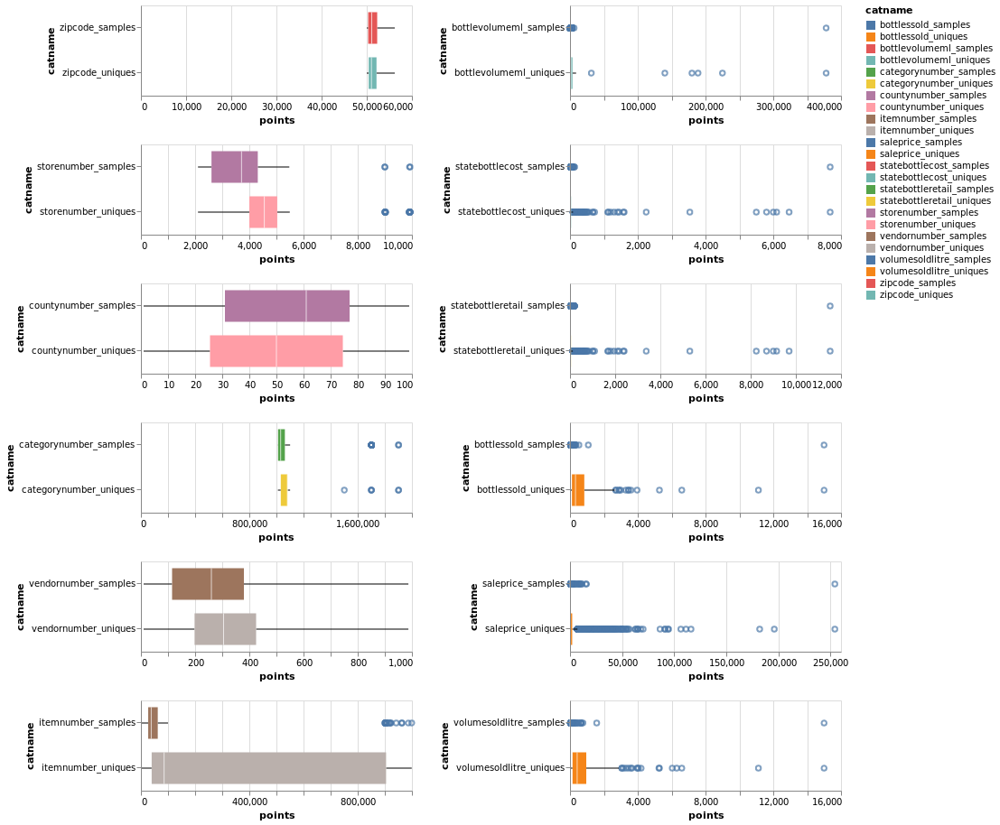

In [80]:
currentDF = gensampledf("zipcode",10000)        
finalChartL = prodchart(currentDF)

for i,item in enumerate(["storenumber","countynumber","categorynumber","vendornumber","itemnumber"]):
    currentDF = gensampledf(item,10000)        
    currChart = prodchart(currentDF)
    finalChartL = finalChartL & currChart


currentDF = gensampledf("bottlevolumeml",10000)        
finalChartR = prodchart(currentDF)

for i,item in enumerate(['statebottlecost', 'statebottleretail', 'bottlessold', 'saleprice', 'volumesoldlitre']):
    currentDF = gensampledf(item,10000)        
    currChart = prodchart(currentDF)
    finalChartR = finalChartR & currChart

finalChartL | finalChartR 